# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'1.0.1'

## Specifying filetype, and folder as before

In [32]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [33]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Medium' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')
if batch=='Std':
    GroupN_df=joblib.load('Std_df.sav')

GroupN_df

,filename,rays_present,approx_split,Diad1_pos,Diad2_pos,HB1_pos,HB2_pos,C13_pos,Diad1_abs_prom,Diad2_abs_prom,...,HB2_height,C13_height,Diad1_height,HB1_height,Diad1_Median_Bck,Diad2_Median_Bck,C13_HB2_abs_prom_ratio,Diad2_HB2_Valley_prom,HB1_prom/std_betweendiads,HB2_prom/std_betweendiads
0,21 187-9-213-FIB.txt,0.0,103.764157,1284.532389,1388.296547,1264.350374,1409.913851,NaN,415.379599,859.078097,...,730.526723,NaN,1094.504599,713.197310,679.125000,678.312500,NaN,1.002391,19.713932,30.406200
1,22 187-9-213-FIA_CRR_DiadFit.txt,1.0,103.351718,1285.670721,1389.022440,NaN,1410.403278,NaN,297.227924,543.474515,...,713.605269,NaN,970.352924,NaN,673.125000,673.312500,NaN,0.994807,NaN,25.061639
2,23 187-9-215-MIA-rep1.txt,0.0,102.999770,1286.528594,1389.528365,1266.088117,1410.771724,NaN,358.320630,622.572548,...,769.300607,NaN,1070.320630,744.333442,712.000000,707.062500,NaN,0.992234,12.590345,27.937514
3,24 187-9-215-MIA-rep2.txt,0.0,103.043764,1286.479102,1389.522866,1266.110113,1410.749727,NaN,384.308074,707.412745,...,780.266816,NaN,1098.433074,748.261492,714.125000,708.750000,NaN,0.993303,12.049502,29.506443
4,26 187-9-215-FIA.txt,0.0,103.885140,1284.185941,1388.071080,1264.289883,1409.974342,NaN,483.901584,1064.475711,...,736.546364,NaN,1158.026584,707.481984,674.125000,674.500000,NaN,1.007778,19.766690,35.540372
5,31 187-9-216-MIA-rep2_CRR_DiadFit.txt,1.0,103.027266,1286.495599,1389.522866,1266.049622,1410.749727,NaN,332.564750,526.368324,...,785.766017,NaN,1067.064750,764.007273,734.500000,732.500000,NaN,0.993859,10.536898,20.227854
6,32 187-9-216-MIA-rep3.txt,0.0,102.999770,1286.534094,1389.533864,1266.115613,1410.766225,NaN,352.326720,559.180393,...,770.264375,NaN,1070.951720,748.992865,718.625000,716.500000,NaN,0.990950,12.366247,23.442891
7,34 187-9-217-MIA-rep1.txt,0.0,103.258232,1285.808201,1389.066433,1265.560195,1410.414277,NaN,750.378837,1367.446469,...,833.866749,NaN,1471.253837,780.818318,720.875000,720.500000,NaN,0.993226,23.604177,45.378942
8,35 187-9-217-MIA-rep2.txt,0.0,103.247234,1285.813700,1389.060934,1265.571193,1410.441773,1370.875123,940.776551,1797.307839,...,862.732999,755.675218,1668.401551,807.613702,727.625000,728.062500,5.153592,1.000858,36.993982,62.278999
9,36 187-9-217-MIA-rep3.txt,0.0,103.252733,1285.808201,1389.060934,1265.527200,1410.353786,NaN,1019.142761,1910.128570,...,867.927599,NaN,1744.142761,816.012709,725.000000,725.375000,NaN,0.994176,37.089400,57.882943


### Now load one file from this group to tweak parameters for

In [34]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

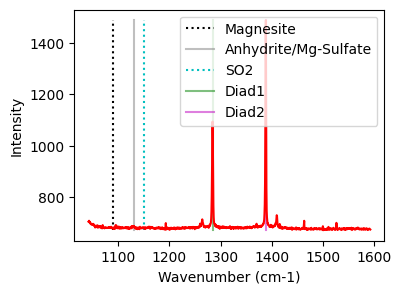

In [35]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [36]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [37]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

# FG04 Standards
if batch=='Std':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init


if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240), upper_bck_diad1=(1315, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=415.37959918871525, HB_prom=34.947310302810706, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1284.459015,1284.459065,0.005817,1156.643279,1.063293,0,1264.384907,150.996775,1.636949,413.686044,2.29907,0.591766,2.126587,Flagged Warnings:,1.193043,1.218274,0.410524,0.005141,PseudoVoigtModel


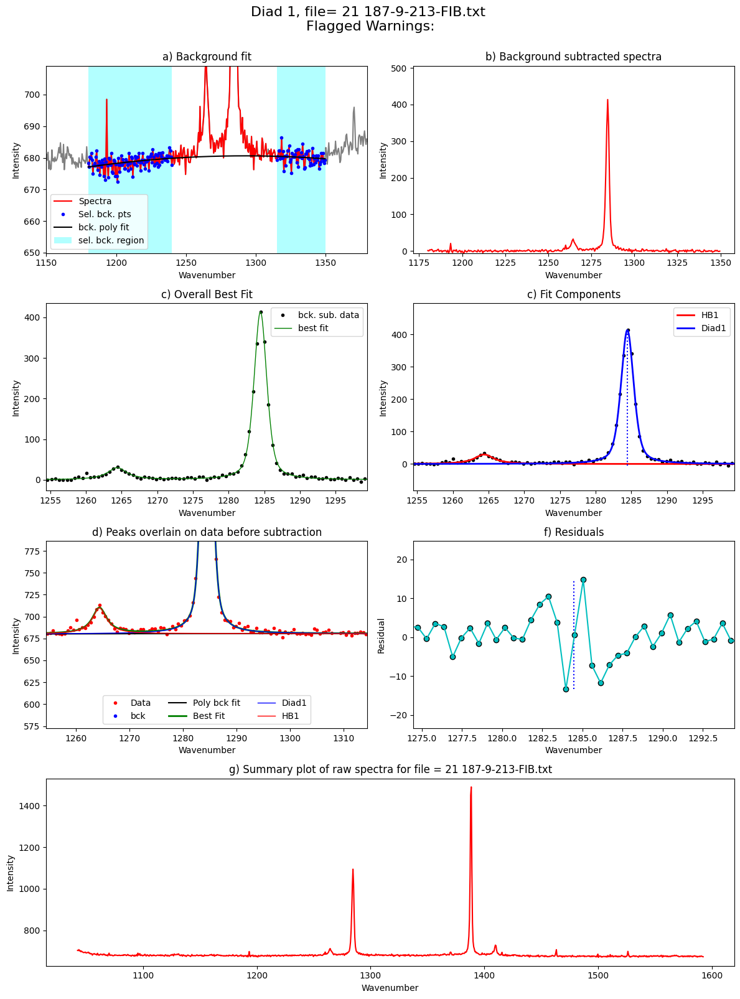

In [38]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [39]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [40]:
if batch=='Std':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init


if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=False, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=3, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1350), upper_bck_diad2=(1440, 1470), fit_gauss=False, gauss_amp=107.80344629007209, diad_sigma=1, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=859.0780969382402, HB_prom=53.901723145036044, C13_prom=nan, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1388.270544,1388.270494,0.003295,1819.120917,0.733646,0,1409.697421,228.558205,1.547441,886.065431,3.727567,0.742819,1.467293,Flagged Warnings:,1.062069,1.08,0.091073,0.001656,PseudoVoigtModel


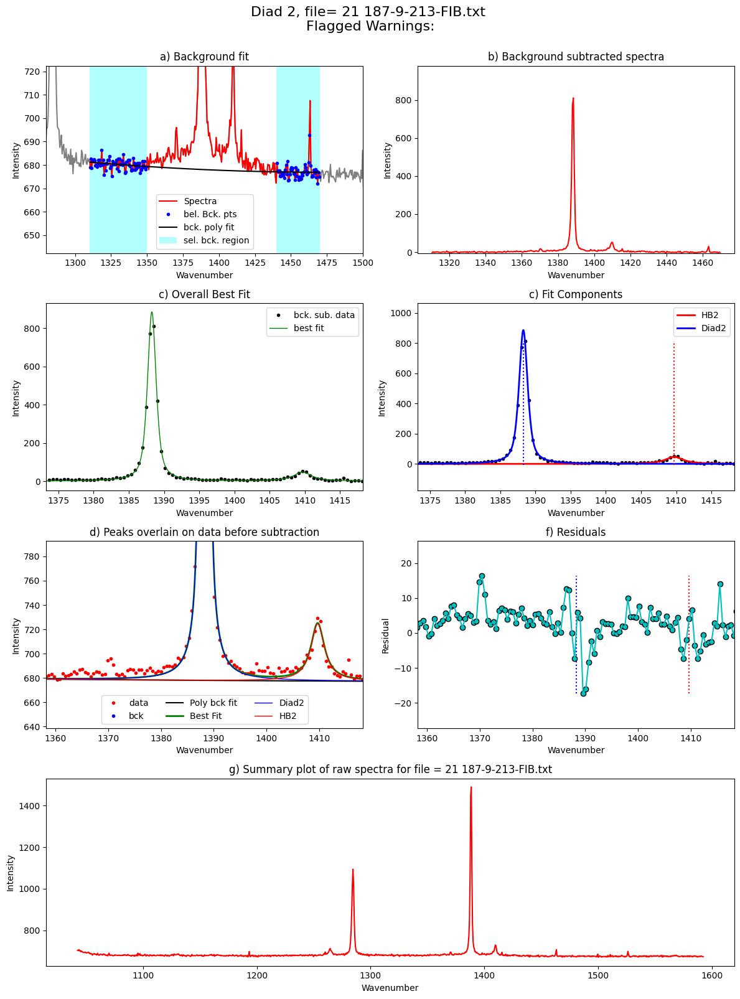

In [41]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/17 [00:00<?, ?it/s]

Processing file: 21 187-9-213-FIB.txt


  6%|▌         | 1/17 [00:02<00:36,  2.25s/it]

Processing file: 22 187-9-213-FIA_CRR_DiadFit.txt


 12%|█▏        | 2/17 [00:04<00:31,  2.13s/it]

Processing file: 23 187-9-215-MIA-rep1.txt


 18%|█▊        | 3/17 [00:06<00:30,  2.15s/it]

Processing file: 24 187-9-215-MIA-rep2.txt


 24%|██▎       | 4/17 [00:09<00:33,  2.61s/it]

Processing file: 26 187-9-215-FIA.txt


 29%|██▉       | 5/17 [00:12<00:30,  2.55s/it]

Processing file: 31 187-9-216-MIA-rep2_CRR_DiadFit.txt


 35%|███▌      | 6/17 [00:14<00:28,  2.58s/it]

Processing file: 32 187-9-216-MIA-rep3.txt


 41%|████      | 7/17 [00:17<00:25,  2.58s/it]

Processing file: 34 187-9-217-MIA-rep1.txt


 47%|████▋     | 8/17 [00:20<00:24,  2.77s/it]

Processing file: 35 187-9-217-MIA-rep2.txt
refit attempt 1


 53%|█████▎    | 9/17 [00:27<00:32,  4.07s/it]

Processing file: 36 187-9-217-MIA-rep3.txt


 59%|█████▉    | 10/17 [00:30<00:25,  3.69s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3218: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 37 187-9-218-MIA-rep1.txt


 65%|██████▍   | 11/17 [00:32<00:19,  3.26s/it]

Processing file: 38 187-9-218-MIA-rep2_CRR_DiadFit.txt


 71%|███████   | 12/17 [00:35<00:14,  3.00s/it]

Processing file: 39 187-9-218-MIA-rep3.txt


 76%|███████▋  | 13/17 [00:37<00:11,  2.84s/it]

Processing file: 46 187-9-220-FIB.txt


 82%|████████▏ | 14/17 [00:39<00:08,  2.71s/it]

Processing file: 48 187-9-220-MIA.txt


 88%|████████▊ | 15/17 [00:42<00:05,  2.61s/it]

Processing file: 49 187-9-220-FIE.txt


 94%|█████████▍| 16/17 [00:44<00:02,  2.59s/it]

Processing file: 50 187-9-220-FID.txt


100%|██████████| 17/17 [00:47<00:00,  2.78s/it]


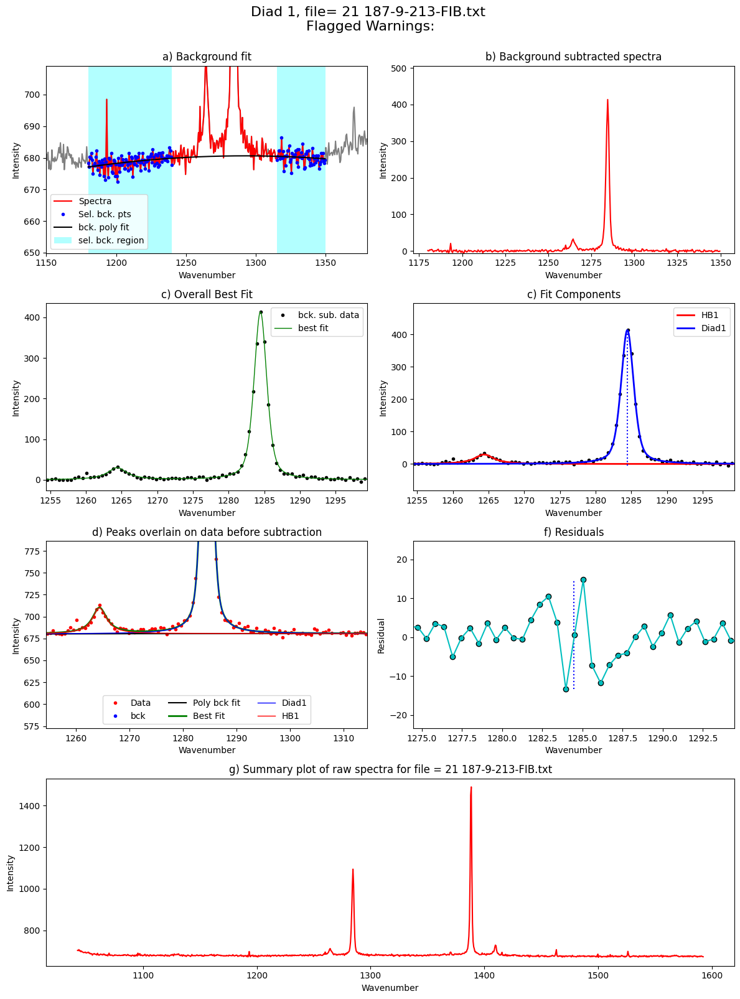

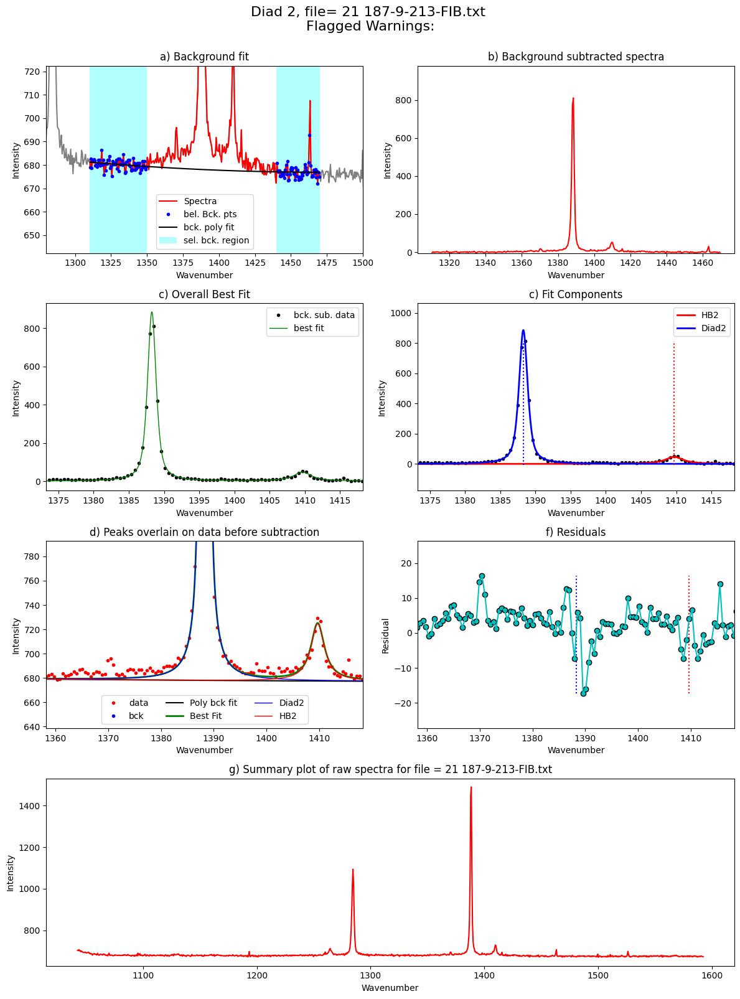

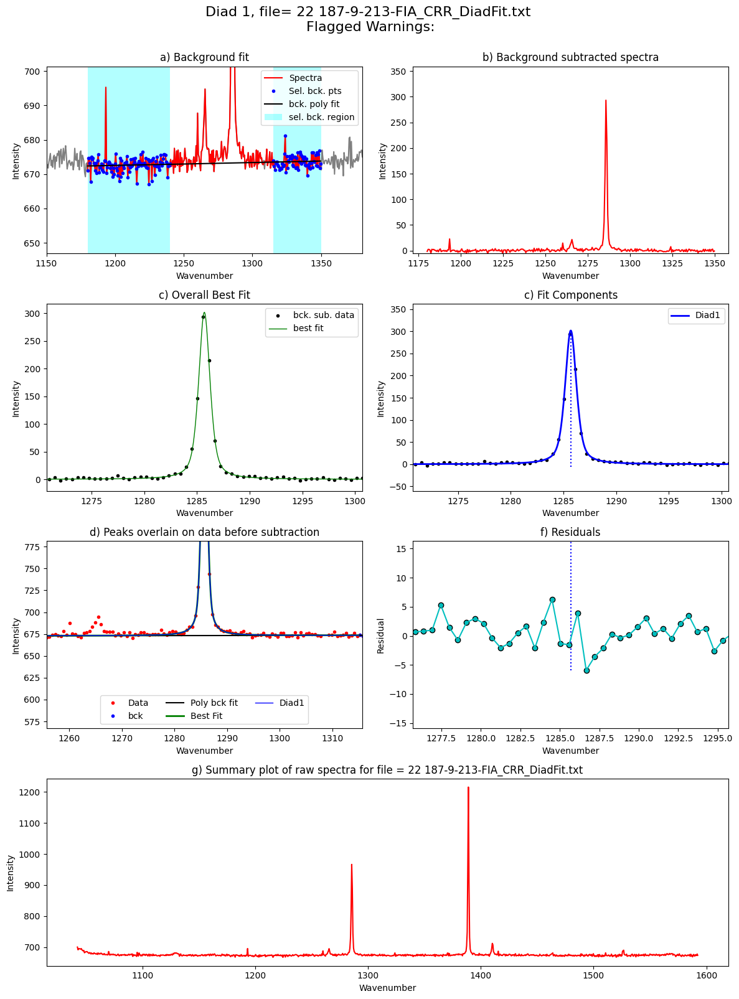

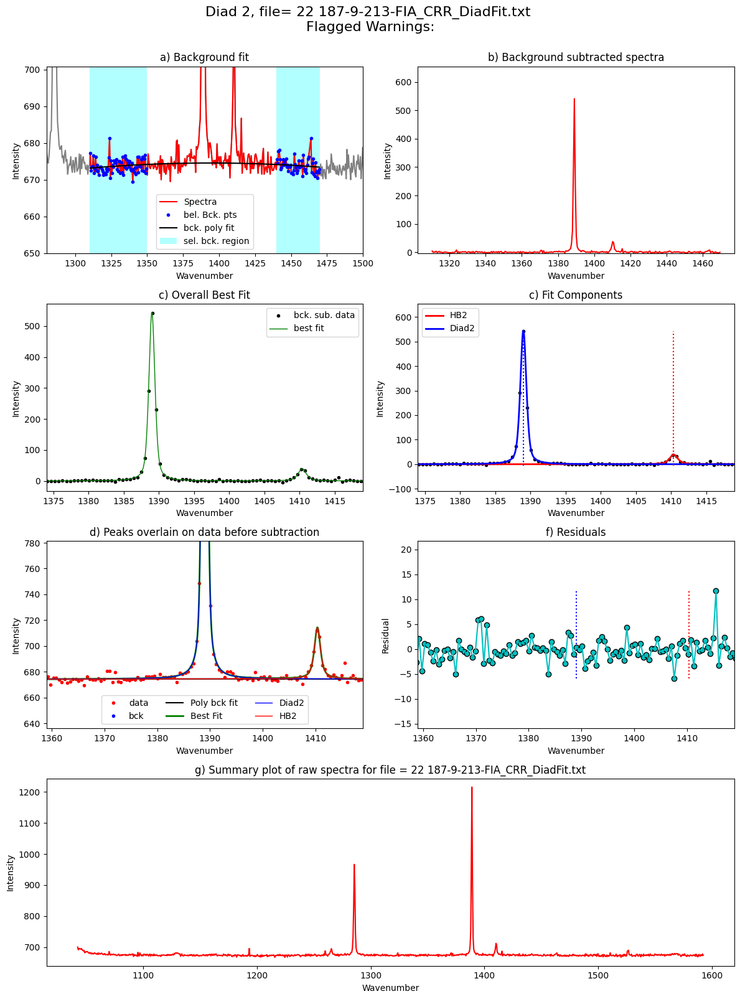

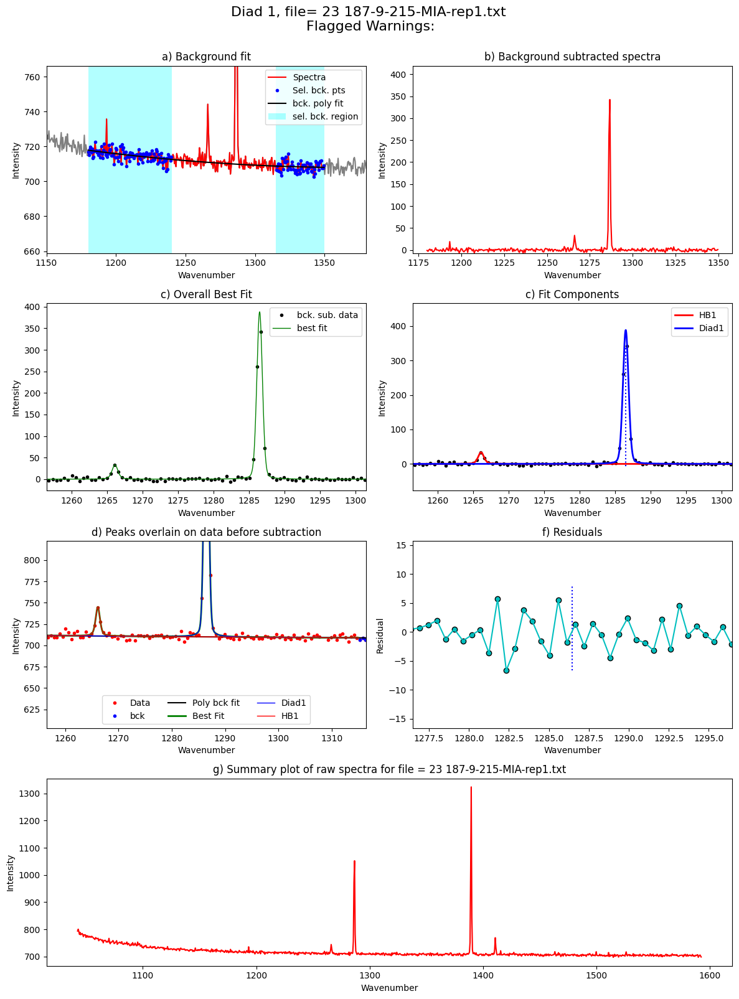

...

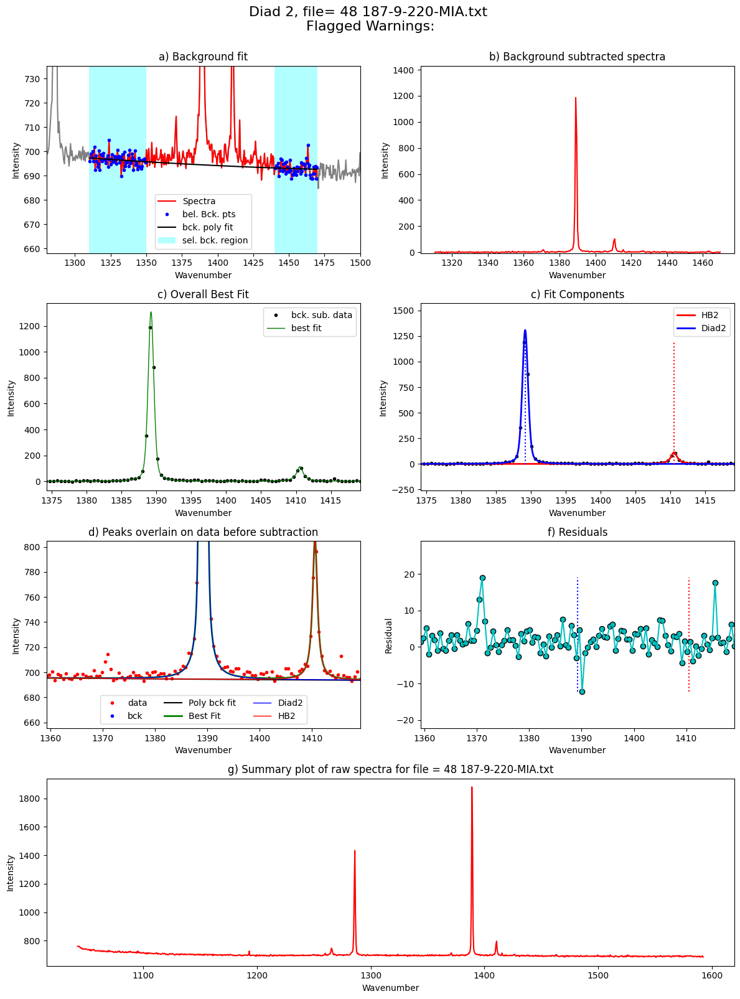

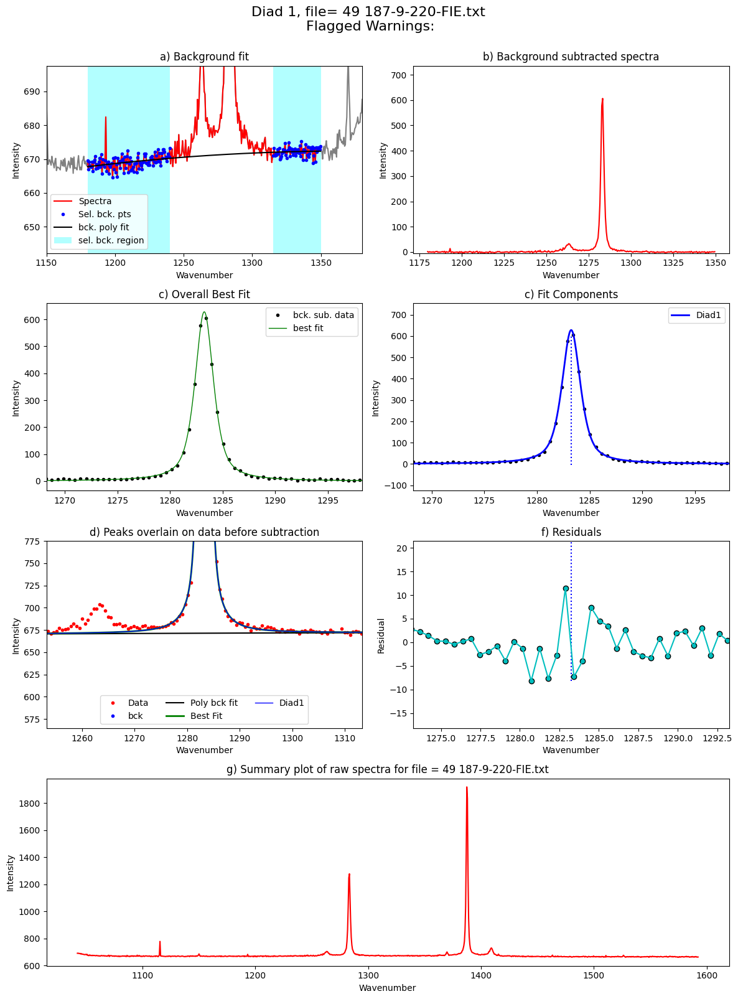

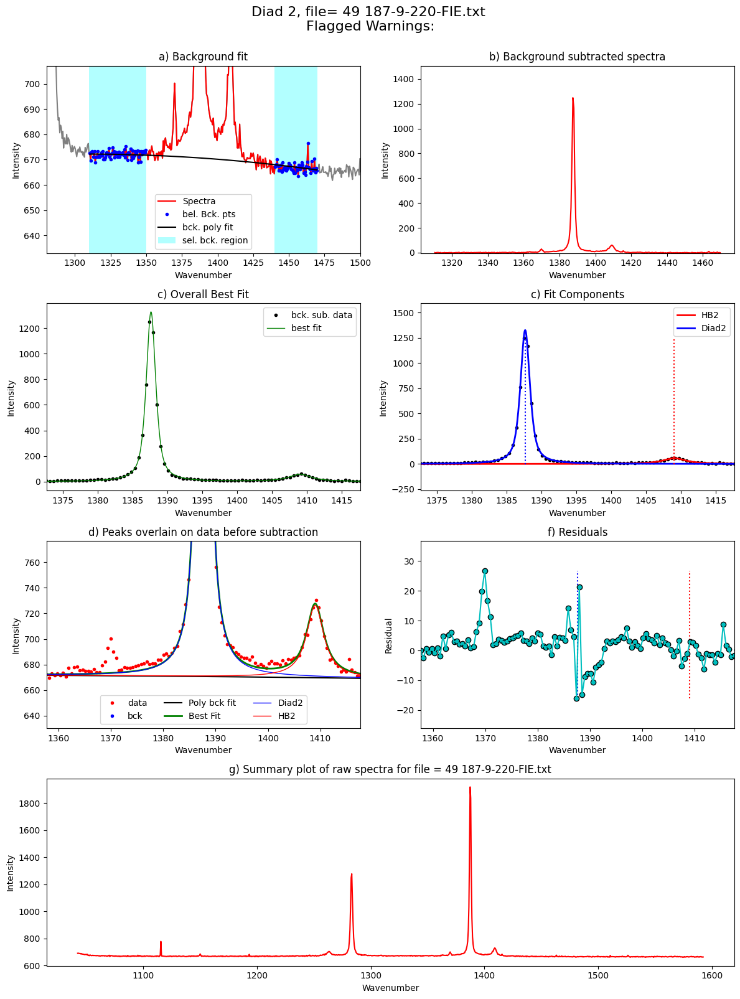

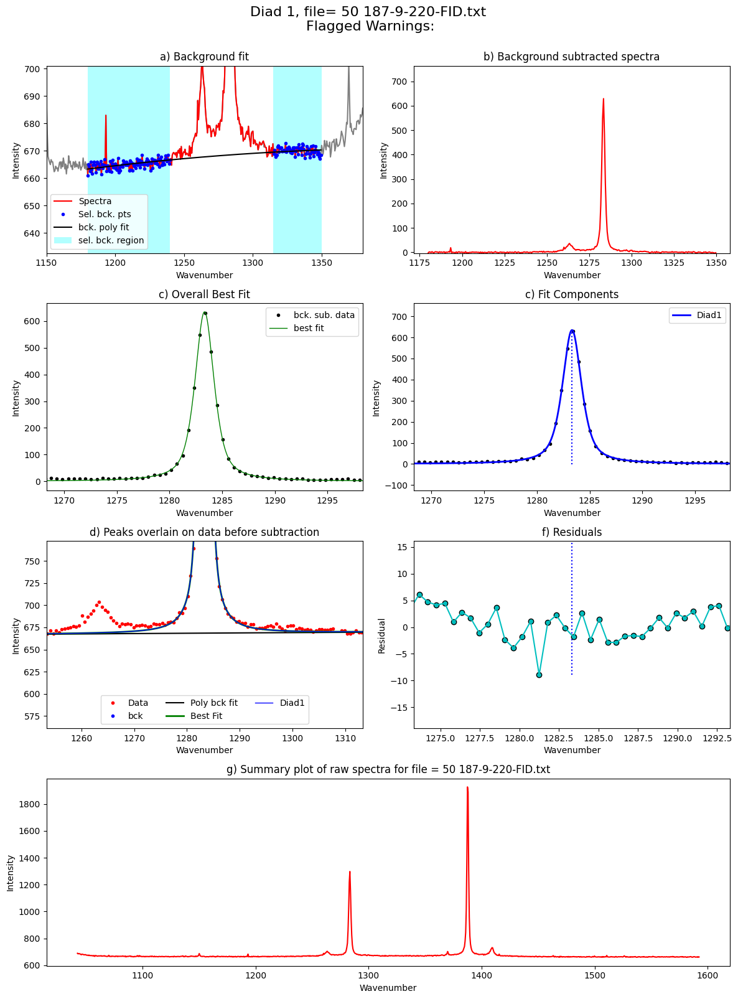

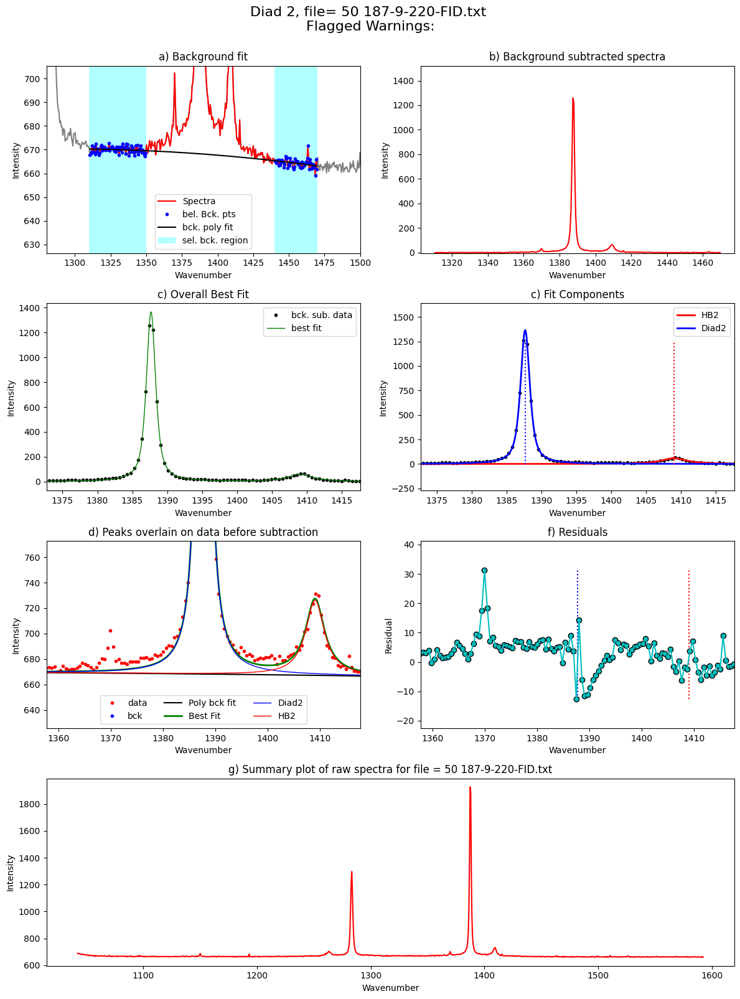

In [42]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [43]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)
if batch=='Std':
    combo.to_excel('Std_Diads.xlsx', index=False)

In [44]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,187-9-213-FIB,103.811430,0.006685,1284.459015,0.005817,413.686044,1284.459065,1156.643279,1.063293,2.299070,...,1.193043,1.218274,0.410524,0.005141,1.062069,1.080000,0.091073,0.001656,PseudoVoigtModel,PseudoVoigtModel
1,187-9-213-FIA_CRR_DiadFit,103.302309,0.007029,1285.694213,0.006653,301.865929,1285.694213,516.764802,0.636999,2.278987,...,1.106849,1.020952,0.136126,0.004220,1.088737,1.104218,0.090756,0.001877,PseudoVoigtModel,PseudoVoigtModel
2,187-9-215-MIA-rep1,102.994789,0.004710,1286.474763,0.003849,388.334323,1286.474813,414.998421,0.465386,2.025750,...,1.236559,1.247191,0.220183,0.002397,1.179916,1.249191,0.146787,0.001257,PseudoVoigtModel,PseudoVoigtModel
3,187-9-215-MIA-rep2,103.022552,0.004536,1286.442931,0.003656,420.848966,1286.442981,461.685618,0.472298,2.359375,...,1.154362,1.159151,0.145810,0.002245,1.179916,1.246753,0.145816,0.001092,PseudoVoigtModel,PseudoVoigtModel
4,187-9-215-FIA,103.993742,0.005880,1284.081753,0.005208,488.883397,1284.081803,1451.206268,1.128179,2.310573,...,1.235786,1.238554,0.532018,0.004615,1.008565,1.060938,0.013435,0.001460,PseudoVoigtModel,PseudoVoigtModel
5,187-9-216-MIA-rep2_CRR_DiadFit,103.021969,0.006185,1286.443650,0.004873,377.289181,1286.443700,438.618390,0.453476,3.017090,...,1.195946,1.204787,0.177714,0.002404,1.188525,1.244444,0.158667,0.001536,PseudoVoigtModel,PseudoVoigtModel
6,187-9-216-MIA-rep3,103.017148,0.006014,1286.467036,0.004722,403.160990,1286.467086,448.544026,0.425758,2.707114,...,1.270073,1.297143,0.229972,0.002112,1.147059,1.207792,0.119491,0.001407,PseudoVoigtModel,PseudoVoigtModel
7,187-9-217-MIA-rep1,103.261797,0.005535,1285.821062,0.005137,807.505318,1285.821112,1327.482403,0.580033,8.601527,...,1.037135,1.001980,0.043079,0.001437,1.064189,1.061275,0.066030,0.000748,PseudoVoigtModel,PseudoVoigtModel
8,187-9-217-MIA-rep2,103.260193,0.004332,1285.819587,0.004057,1010.529118,1285.819637,1647.810085,0.578515,8.142351,...,1.015873,1.020121,0.018366,0.001145,1.059649,1.069054,0.058860,0.000547,PseudoVoigtModel,PseudoVoigtModel
9,187-9-217-MIA-rep3,103.260189,0.003714,1285.820070,0.003417,1095.501420,1285.820120,1756.838097,0.571808,7.563744,...,1.032258,1.000000,0.036891,0.001044,1.062718,1.070886,0.062486,0.000520,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [45]:
# # !pip install winotify

# from winotify import Notification, audio

# toast= Notification(app_id="VSCode",title="Notebook completed",
#                     msg="Step3b_Secondary_Peaks is done!",
#                     duration="short")
# toast.set_audio(audio.Mail,loop=False)
# toast.show()